## Load libraries


In [6]:
%matplotlib ipympl

import mne
import autoreject
from autoreject import AutoReject
from autoreject import get_rejection_threshold
from mne.preprocessing import ICA
import toml
import mne_bids
import re
from pathlib import Path
import numpy as np
mne.viz.set_browser_backend("qt")

config = toml.load("../../.env.toml")
project_path = config["project"]["path"]

In [7]:
project_path = config["project"]["path"]
# Into which directory the data should go
data_path = f"{project_path}/data/raw/BIDS"
files = [file for file in Path(data_path).glob("**/*.set")]
files = sorted(files, key=lambda file: file.name)
display(files)

[PosixPath('/Users/daniel/PhD/Projects/psd-path/data/raw/BIDS/sub-101/ses-01/eeg/sub-101_ses-01_task-rest_eeg.set'),
 PosixPath('/Users/daniel/PhD/Projects/psd-path/data/raw/BIDS/sub-102/ses-01/eeg/sub-102_ses-01_task-rest_eeg.set'),
 PosixPath('/Users/daniel/PhD/Projects/psd-path/data/raw/BIDS/sub-103/ses-01/eeg/sub-103_ses-01_task-rest_eeg.set'),
 PosixPath('/Users/daniel/PhD/Projects/psd-path/data/raw/BIDS/sub-104/ses-01/eeg/sub-104_ses-01_task-rest_eeg.set'),
 PosixPath('/Users/daniel/PhD/Projects/psd-path/data/raw/BIDS/sub-105/ses-01/eeg/sub-105_ses-01_task-rest_eeg.set'),
 PosixPath('/Users/daniel/PhD/Projects/psd-path/data/raw/BIDS/sub-106/ses-01/eeg/sub-106_ses-01_task-rest_eeg.set'),
 PosixPath('/Users/daniel/PhD/Projects/psd-path/data/raw/BIDS/sub-107/ses-01/eeg/sub-107_ses-01_task-rest_eeg.set'),
 PosixPath('/Users/daniel/PhD/Projects/psd-path/data/raw/BIDS/sub-108/ses-01/eeg/sub-108_ses-01_task-rest_eeg.set'),
 PosixPath('/Users/daniel/PhD/Projects/psd-path/data/raw/BIDS/su

## Browse data


In [8]:
# fname_path = "/Volumes/ExtremePro/DATA PATHS/DATI_PATHS/Raw_data/PATHS_101_Resting_20191120_022103.mff"
fname_path = files[0]
raw = mne.io.read_raw_eeglab(files[1], preload=True).resample(sfreq=126)

# raw = mne.io.read_raw_egi(fname_path, preload=True)
ch_name_type = dict(zip(raw.ch_names, raw.get_channel_types()))

ch_name_ecg = [name for name in raw.ch_names if name in "ECG"]
dict_ecg = {sub[0]: "ecg" for sub in (ele.split() for ele in ch_name_ecg)}
raw.set_channel_types(dict_ecg)

Measurement date,Unknown
Experimenter,Unknown
Participant,Unknown
Digitized points,261 points
Good channels,"257 EEG, 1 ECG"
Bad channels,None
EOG channels,Not available
ECG channels,ECG
Sampling frequency,126.00 Hz
Highpass,0.00 Hz
Lowpass,63.00 Hz


In [12]:
raw.set_montage("GSN-HydroCel-257", match_alias={"VREF": "Cz"})
mne

Using pyopengl with version 3.1.6


In [11]:
raw_downsampled = raw.crop(tmin=0, tmax=300, include_tmax=True).resample(sfreq=128)

filter_params = {
    "l_freq": 0.5,
    "h_freq": 45,
    "h_trans_bandwidth": 5,
    "fir_design": "firwin2",
    "phase": "zero-double",
}
raw_filtered = raw_downsampled.filter(**filter_params)  # removedrifts
raw_filtered.info["bads"].append("VREF")  # add a single channel

# raw.info["line_freq"] = 50.0
# freqs = 50
# eeg_picks = mne.pick_types(raw.info, eeg=True)
# raw_filtered.notch_filter(freqs=freqs, picks=eeg_picks)
# raw_filtered.plot_sensors(show_names=True)

_ = mne.viz.plot_raw(raw_filtered, duration=20.0)
# raw.drop_channels("VREF", on_missing="raise")

Using pyopengl with version 3.1.6
Sampling frequency of the instance is already 128.0, returning unmodified.
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 45 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hamming window
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 45.00 Hz
- Upper transition bandwidth: 5.00 Hz (-12 dB cutoff frequency: 47.50 Hz)
- Filter length: 1690 samples (13.203 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.2s


Using pyopengl with version 3.1.6


Not setting metadata


100 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 100 events and 385 original time points ...
0 bad epochs dropped
Not setting metadata
100 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 100 events and 384 original time points ...
0 bad epochs dropped
No projector specified for this dataset. Please consider the method self.add_proj.


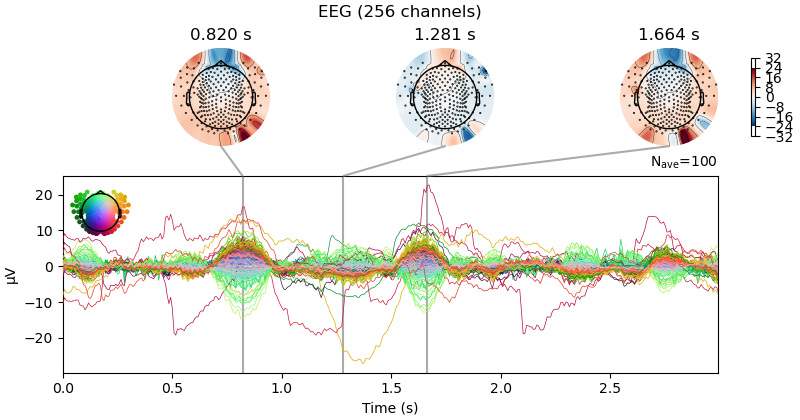

Effective window size : 3.000 (s)
Averaging across epochs...


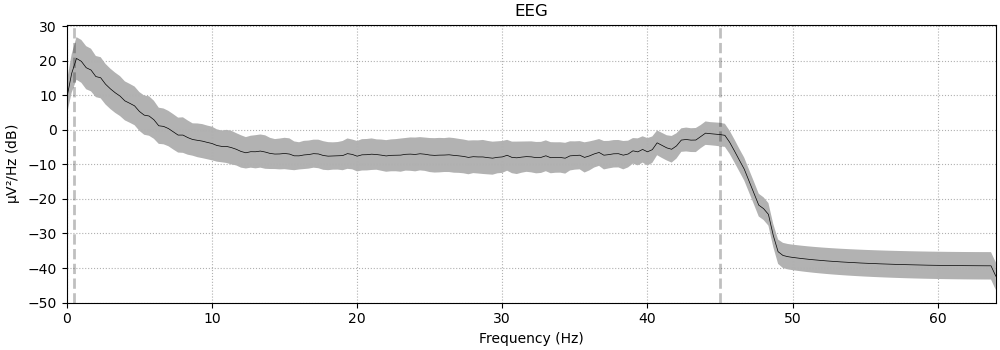

In [11]:
events = mne.make_fixed_length_events(
    raw=raw_filtered, start=0, stop=None, duration=3, overlap=0, first_samp=False
)

# Create  Epochs object
epochs = mne.Epochs(
    raw=raw_filtered,
    events=events,
    tmin=0,
    tmax=3,
    detrend=0,
    baseline=None,
    preload=True,
)

epochs = mne.make_fixed_length_epochs(raw_filtered, duration=3, preload=True)
# plot the data
epochs.average().detrend().plot_joint()
psd_plot = epochs.compute_psd(method="welch", picks="eeg", exclude="bads").plot(
    average=True, picks="eeg", exclude="bads", show=False
)

## First run of the autoterejct


In [12]:
ar = autoreject.AutoReject(
    n_interpolate=[1, 2, 4, 8, 16, 32, 64, 128, 256],
    random_state=11,
    n_jobs=-1,
    verbose=True,
)
ar.fit(epochs)  # fit on a few epochs to save time
epochs_ar, reject_log = ar.transform(epochs, return_log=True)

Running autoreject on ch_type=eeg


/Users/daniel/.pyenv/versions/spectral-3.11/lib/python3.11/site-packages/autoreject/utils.py:73: UserWarning: 2 channels are marked as bad. These will be ignored. If you want them to be considered by autoreject please remove them from epochs.info["bads"].
  warnings.warn(


  0%|          | Creating augmented epochs : 0/256 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/256 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/100 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/8 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/100 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/100 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/100 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/100 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/100 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/100 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/100 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/100 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.80 and n_interpolate=128


/Users/daniel/.pyenv/versions/spectral-3.11/lib/python3.11/site-packages/autoreject/utils.py:73: UserWarning: 2 channels are marked as bad. These will be ignored. If you want them to be considered by autoreject please remove them from epochs.info["bads"].
  warnings.warn(


  0%|          | Repairing epochs : 0/100 [00:00<?,       ?it/s]

Dropped 44 epochs: 0, 1, 2, 3, 6, 7, 8, 10, 13, 14, 15, 17, 18, 20, 22, 23, 28, 34, 41, 42, 43, 46, 48, 49, 51, 52, 53, 59, 60, 63, 64, 65, 67, 68, 69, 70, 79, 83, 88, 91, 93, 94, 96, 99


No projector specified for this dataset. Please consider the method self.add_proj.


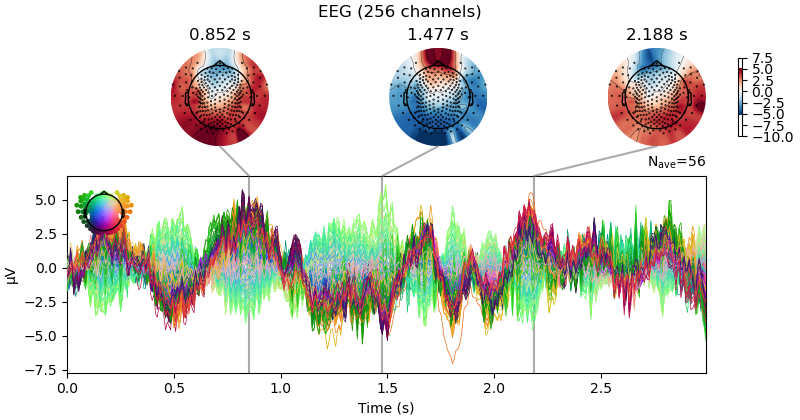

Effective window size : 3.000 (s)
Averaging across epochs...
EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
<Info | 10 non-empty values
 bads: 2 items (VREF, VREF)
 ch_names: E1, E2, E3, E4, E5, E6, E7, E8, E9, E10, E11, E12, E13, E14, ...
 chs: 257 EEG, 1 ECG
 custom_ref_applied: True
 dig: 260 items (3 Cardinal, 257 EEG)
 highpass: 0.5 Hz
 lowpass: 45.0 Hz
 meas_date: unspecified
 nchan: 258
 projs: []
 sfreq: 128.0 Hz
>


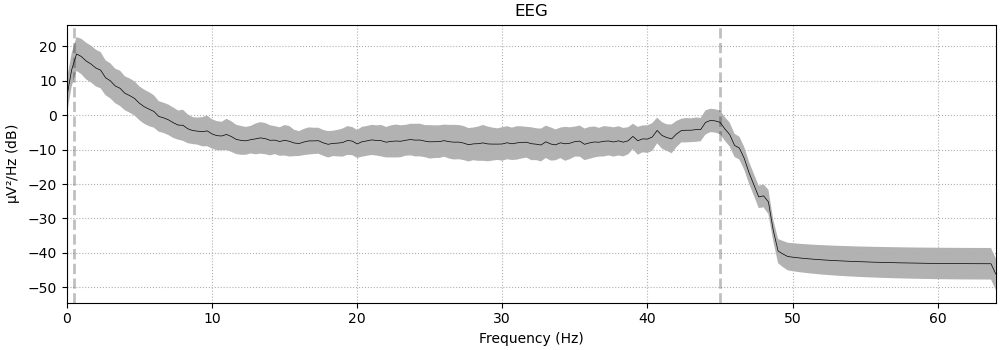

In [13]:
epochs_ar.average().detrend().plot_joint()
_ = epochs_ar.compute_psd(method="welch", picks="eeg", exclude="bads").plot(
    average=True, picks="eeg", exclude="bads", show=False
)

epochs_ar.set_eeg_reference("average")
print(epochs_ar.info)

Using pyopengl with version 3.1.6


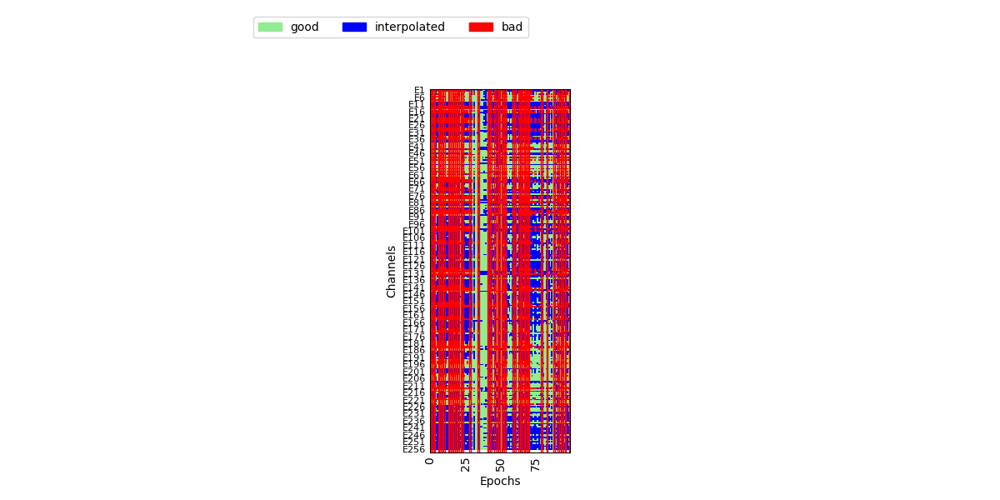

In [14]:
epochs[reject_log.bad_epochs].plot(scalings=dict(eeg=100e-6))
_ = reject_log.plot("horizontal", show=False)

# ICA


## First ICA


In [15]:
# compute ICA

ica = mne.preprocessing.ICA(random_state=99, n_components=100, method="picard")
ica.fit(epochs[~reject_log.bad_epochs])
ica.plot_sources(epochs[~reject_log.bad_epochs], show_scrollbars=False)

Fitting ICA to data using 256 channels (please be patient, this may take a while)
Selecting by number: 100 components
Fitting ICA took 15.9s.


Method,picard
Fit parameters,max_iter=500
Fit,451 iterations on epochs (21504 samples)
ICA components,100
Available PCA components,256
Channel types,eeg
ICA components marked for exclusion,—


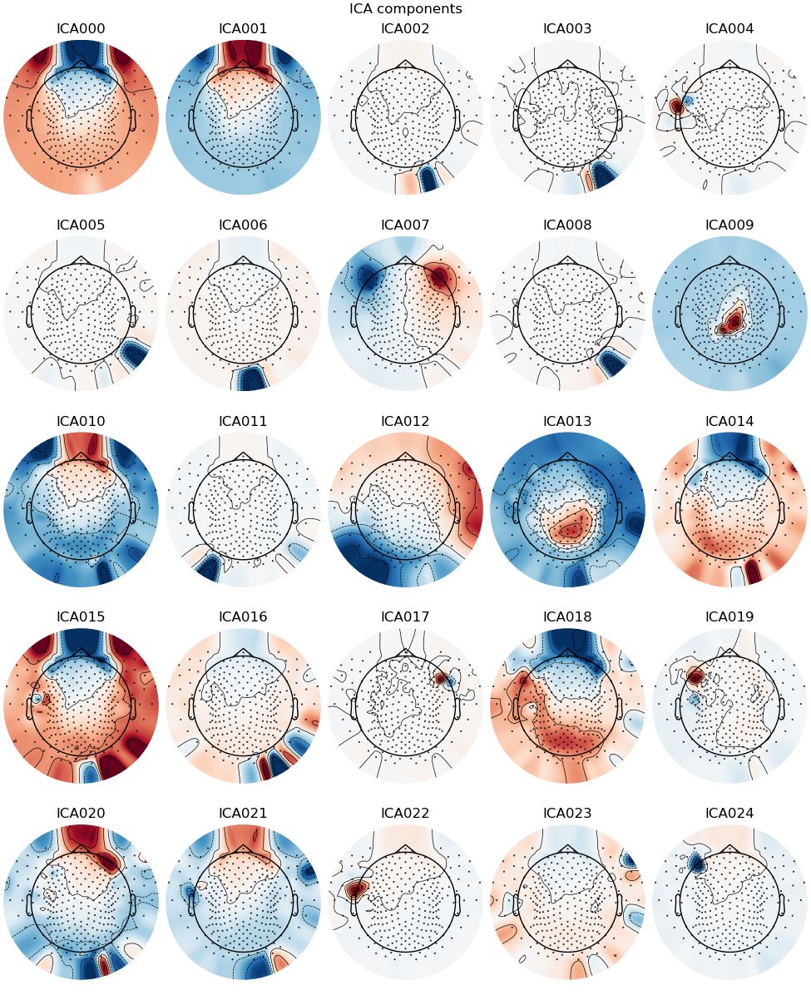

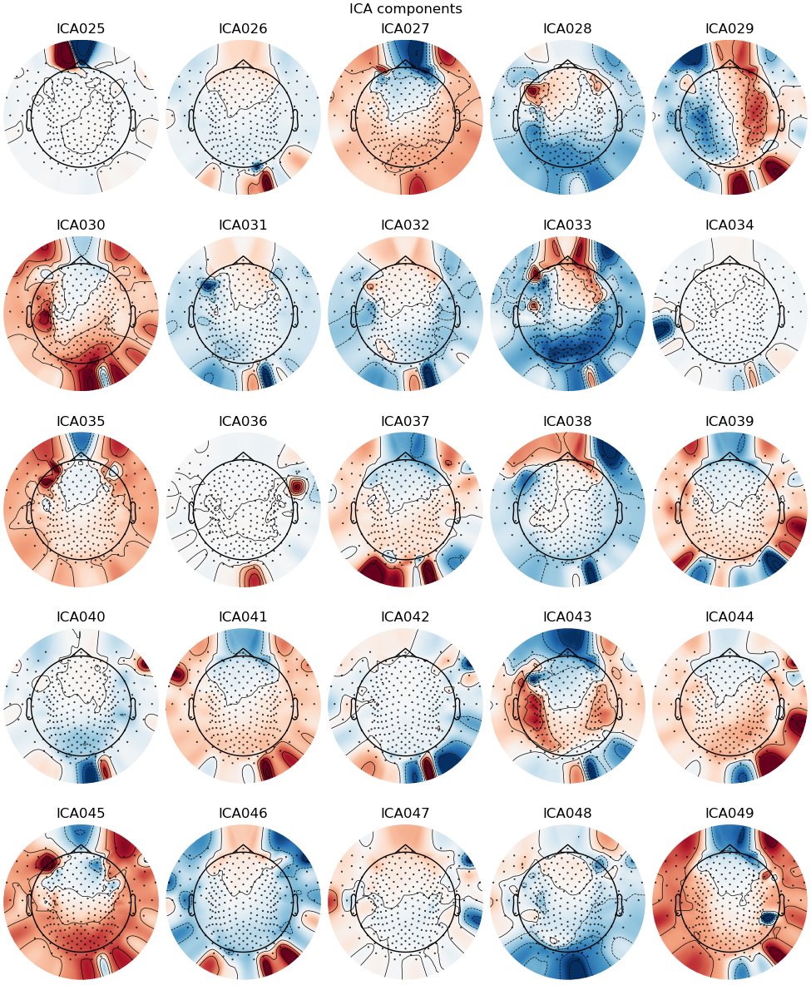

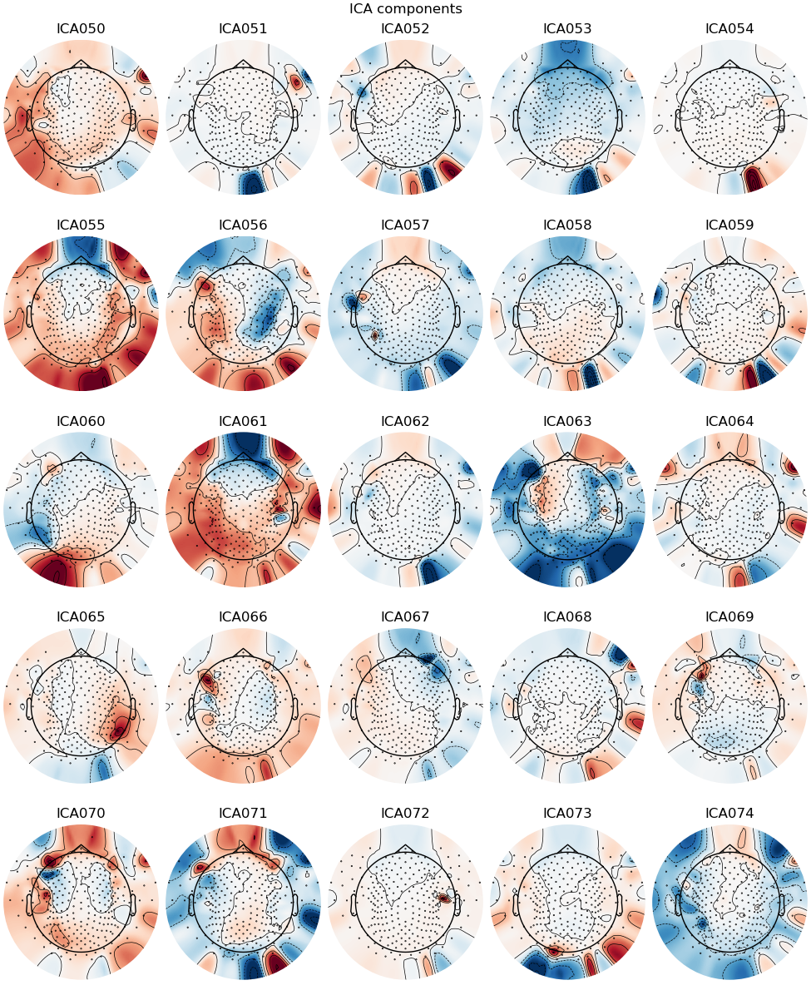

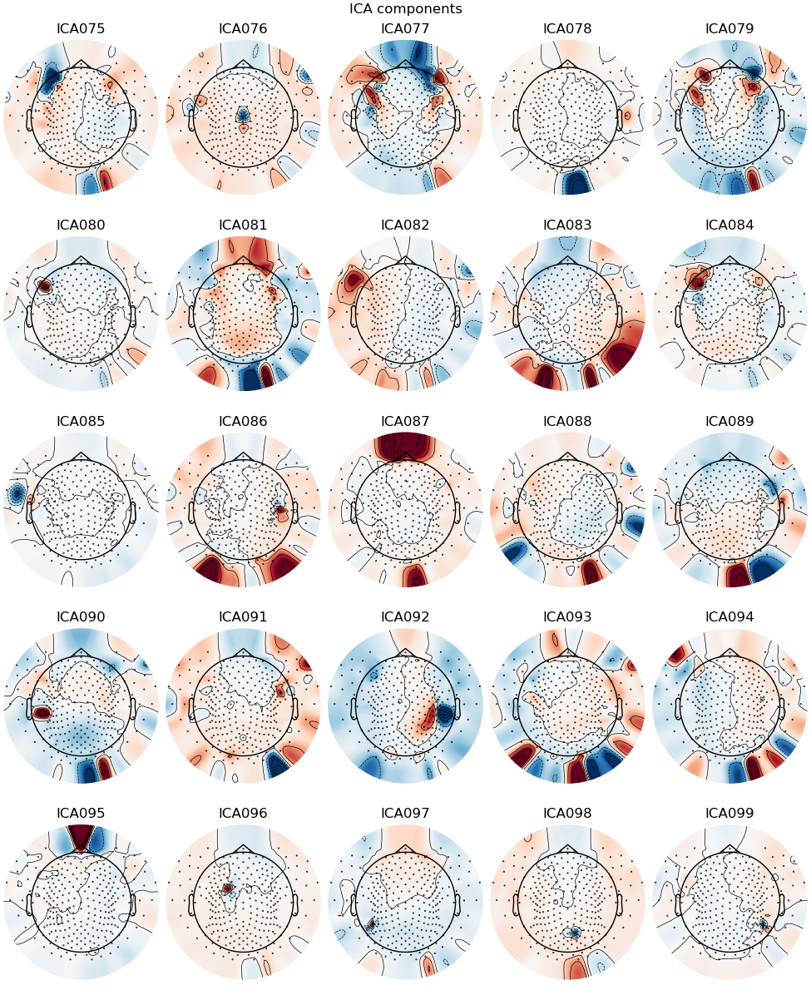

Not setting metadata
56 matching events found
No baseline correction applied
0 projection items activated
Using pyopengl with version 3.1.6


In [16]:
_ = ica.plot_components(picks=slice(0, 25))
_ = ica.plot_components(picks=slice(25, 50))
_ = ica.plot_components(picks=slice(50, 75))
_ = ica.plot_components(picks=slice(75, 100))

# bad 1, 4, 12, 16, 27, 29, 84, 94, 61, 64
# ica.exclude = [12, 15, 17, 18, 67]
# ica.exclude = [12, 15, 17, 18, 67]
ica.plot_sources(epochs[~reject_log.bad_epochs], show_scrollbars=False)

In [17]:
ica.exclude = [1, 2, 3, 4, 6, 8, 9, 12, 17, 22, 25, 34, 36, 54, 72, 98, 96]
epoch_clean = ica.apply(epochs, exclude=ica.exclude)

Applying ICA to Epochs instance
    Transforming to ICA space (100 components)
    Zeroing out 17 ICA components
    Projecting back using 256 PCA components


Not setting metadata
75 matching events found
No baseline correction applied
0 projection items activated
Using pyopengl with version 3.1.6


In [27]:
# "ICA012", "ICA015", "ICA018", "ICA017" "ICA067"
# ica.exclude = [12, 15, 17, 18, 67]
# epoch_clean = ica.apply(epochs, exclude=ica.exclude)

Applying ICA to Epochs instance
    Transforming to ICA space (100 components)
    Zeroing out 5 ICA components
    Projecting back using 256 PCA components


In [18]:
ar = autoreject.AutoReject(
    n_interpolate=[
        1,
        2,
        4,
        8,
        16,
        32,
        64,
        128,
    ],
    random_state=11,
    n_jobs=-1,
    verbose=True,
)
ar.fit(epoch_clean)  # fit on a few epochs to save time

Running autoreject on ch_type=eeg


/Users/daniel/.pyenv/versions/spectral-3.11/lib/python3.11/site-packages/autoreject/utils.py:73: UserWarning: 2 channels are marked as bad. These will be ignored. If you want them to be considered by autoreject please remove them from epochs.info["bads"].
  warnings.warn(


  0%|          | Creating augmented epochs : 0/256 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/256 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/100 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/8 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/100 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/100 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/100 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/100 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/100 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/100 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/100 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/100 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.70 and n_interpolate=64


AutoReject(consensus=array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
      cv=10, n_interpolate=[1, 2, 4, 8, 16, 32, 64, 128], n_jobs=-1,
      picks=None, random_state=11, thresh_method='bayesian_optimization',
      verbose=True)

  0%|          | Repairing epochs : 0/100 [00:00<?,       ?it/s]

Dropped 10 epochs: 23, 42, 83, 86, 88, 94, 95, 96, 97, 99
No projector specified for this dataset. Please consider the method self.add_proj.


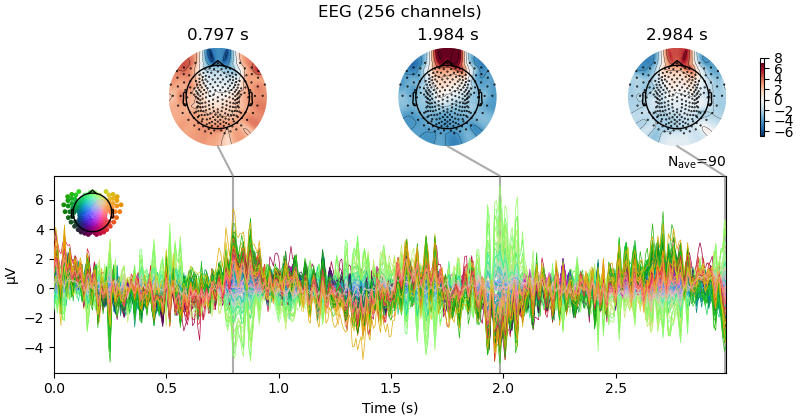

Effective window size : 3.000 (s)
Averaging across epochs...
EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
<Info | 10 non-empty values
 bads: 2 items (VREF, VREF)
 ch_names: E1, E2, E3, E4, E5, E6, E7, E8, E9, E10, E11, E12, E13, E14, ...
 chs: 257 EEG, 1 ECG
 custom_ref_applied: True
 dig: 260 items (3 Cardinal, 257 EEG)
 highpass: 0.5 Hz
 lowpass: 45.0 Hz
 meas_date: unspecified
 nchan: 258
 projs: []
 sfreq: 128.0 Hz
>


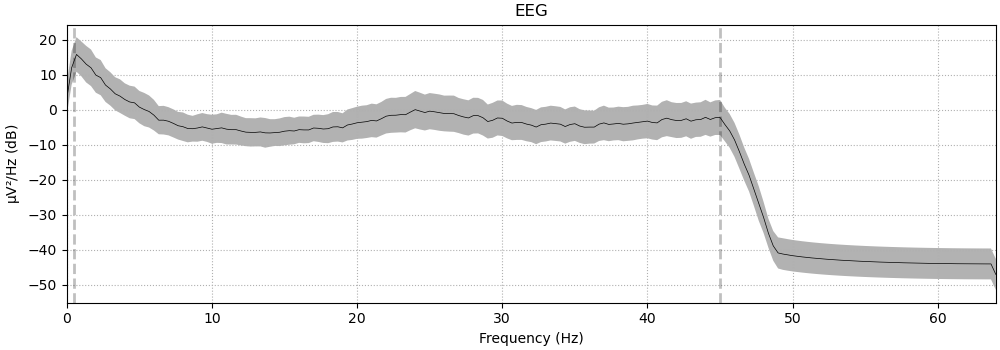

In [19]:
epochs_ar, reject_log = ar.transform(epoch_clean, return_log=True)
epochs_ar.average().detrend().plot_joint()
_ = epochs_ar.compute_psd(method="welch", picks="eeg", exclude="bads").plot(
    average=True, picks="eeg", exclude="bads", show=False
)

epochs_ar.set_eeg_reference("average")
print(epochs_ar.info)

Effective window size : 3.000 (s)


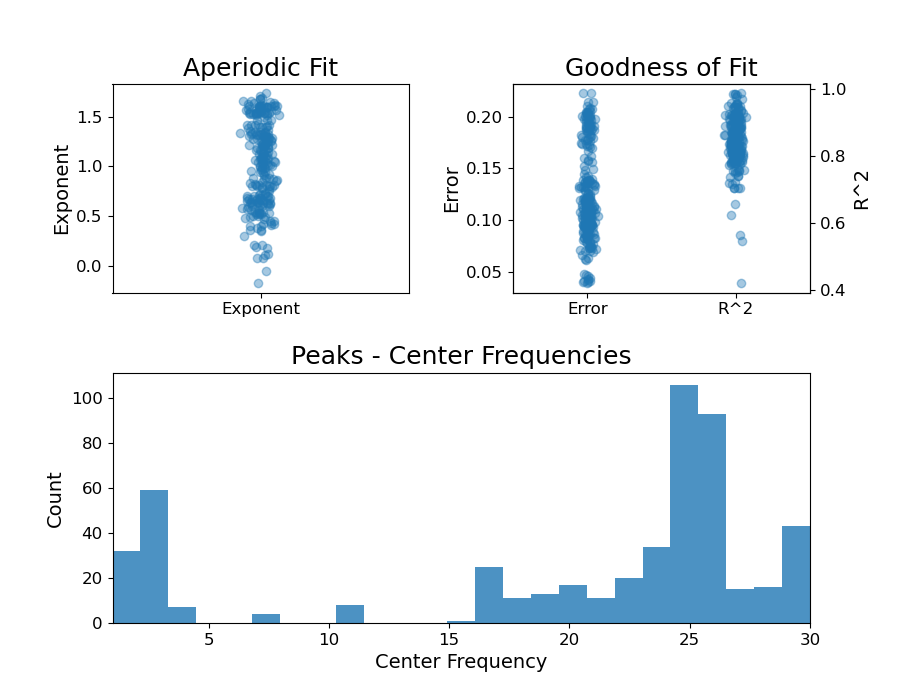

In [21]:
from fooof.plts.spectra import plot_spectra
from fooof.analysis import get_band_peak_fg
from fooof.bands import Bands
from fooof import FOOOFGroup

psd = epochs_ar.compute_psd(method="welch").average()
spectra, freqs = psd.get_data(return_freqs=True)
# Initialize a FOOOFGroup object, with desired settings

fg = FOOOFGroup(
    peak_width_limits=[1, 6],
    min_peak_height=0.15,
    peak_threshold=2.0,
    max_n_peaks=6,
    verbose=False,
)

# Define the frequency range to fit
freq_range = [1, 30]
fg.fit(freqs, spectra, freq_range)
fg.plot()

ValueError: Number of channels in the Info object (257) and the data array (256) do not match. Pick Info with e.g. mne.pick_info and mne.channel_indices_by_type.

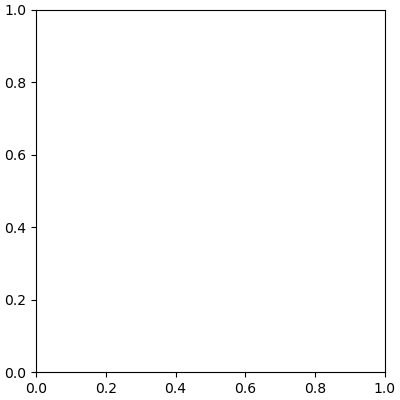

In [22]:
# Define frequency bands of interest
from matplotlib import cm, colors, colorbar

bands = Bands({"theta": [3, 7], "alpha": [7, 14], "beta": [15, 30]})

# Extract alpha peaks
alphas = get_band_peak_fg(fg, bands.alpha)

# Extract the power values from the detected peaks
alpha_pw = alphas[:, 1]

# Plot the topography of alpha power

mne.viz.plot_topomap(alpha_pw, raw.info, cmap=cm.viridis, contours=0, size=4)